# Project Title :
## EMIPredict AI - Intelligent Financial Risk Assessment Platform

# Problem Statement:

  > Build a comprehensive financial risk assessment platform that integrates machine learning models with MLflow experiment tracking to create an interactive web application for EMI prediction.
  Nowadays, people struggle to pay EMI due to poor financial planning and inadequate risk assessment. This project aims to solve this critical issue by providing data-driven insights for better loan decisions.


# Actual Product

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import pandas as pd
import numpy as np
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             roc_auc_score, confusion_matrix, classification_report,
                             mean_squared_error, mean_absolute_error, r2_score)
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC, SVR
from xgboost import XGBClassifier, XGBRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, RandomForestRegressor
from sklearn.preprocessing import LabelBinarizer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV

In [3]:
data=pd.read_csv('/content/drive/MyDrive/Labmentix/EMI Tracker/emi_prediction_dataset.csv',low_memory=False)

In [4]:
data.head()

,age,gender,marital_status,education,monthly_salary,employment_type,years_of_employment,company_type,house_type,monthly_rent,...,existing_loans,current_emi_amount,credit_score,bank_balance,emergency_fund,emi_scenario,requested_amount,requested_tenure,emi_eligibility,max_monthly_emi
0,38,Female,Married,Professional,82600.0,Private,0.9,Mid-size,Rented,20000.0,...,Yes,23700.0,660.0,303200.0,70200.0,Personal Loan EMI,850000.0,15,Not_Eligible,500.0
1,38,Female,Married,Graduate,21500.0,Private,7.0,MNC,Family,0.0,...,Yes,4100.0,714.0,92500.0,26900.0,E-commerce Shopping EMI,128000.0,19,Not_Eligible,700.0
2,38,Male,Married,Professional,86100.0,Private,5.8,Startup,Own,0.0,...,No,0.0,650.0,672100.0,324200.0,Education EMI,306000.0,16,Eligible,27775.0
3,58,Female,Married,High School,66800.0,Private,2.2,Mid-size,Own,0.0,...,No,0.0,685.0,440900.0,178100.0,Vehicle EMI,304000.0,83,Eligible,16170.0
4,48,Female,Married,Professional,57300.0,Private,3.4,Mid-size,Family,0.0,...,No,0.0,770.0,97300.0,28200.0,Home Appliances EMI,252000.0,7,Not_Eligible,500.0


In [5]:
data.dtypes

,0
age,object
gender,object
marital_status,object
education,object
monthly_salary,object
employment_type,object
years_of_employment,float64
company_type,object
house_type,object
monthly_rent,float64


In [6]:
data.shape

(404800, 27)

In [7]:
data.isnull().sum()

,0
age,0
gender,0
marital_status,0
education,2404
monthly_salary,0
employment_type,0
years_of_employment,0
company_type,0
house_type,0
monthly_rent,2426


In [8]:
print(f"Original shape: {data.shape}")
data.dropna(inplace=True)
print(f"Shape after dropping nulls: {data.shape}")


Original shape: (404800, 27)
Shape after dropping nulls: (392920, 27)


In [9]:
print("Null values after dropping:")
print(data.isnull().sum())


Null values after dropping:
age                       0
gender                    0
marital_status            0
education                 0
monthly_salary            0
employment_type           0
years_of_employment       0
company_type              0
house_type                0
monthly_rent              0
family_size               0
dependents                0
school_fees               0
college_fees              0
travel_expenses           0
groceries_utilities       0
other_monthly_expenses    0
existing_loans            0
current_emi_amount        0
credit_score              0
bank_balance              0
emergency_fund            0
emi_scenario              0
requested_amount          0
requested_tenure          0
emi_eligibility           0
max_monthly_emi           0
dtype: int64


## Data Pre Processing

In [10]:
# Taking out object columns
object_columns=data.select_dtypes(include=['object']).columns
print(f"Columns consist object datatype : {object_columns}")

Columns consist object datatype : Index(['age', 'gender', 'marital_status', 'education', 'monthly_salary',
       'employment_type', 'company_type', 'house_type', 'existing_loans',
       'bank_balance', 'emi_scenario', 'emi_eligibility'],
      dtype='object')


In [11]:
for col in object_columns:
  print(f"Unique values for {col} are : {data[col].unique()[:10]}")
  print("-"*100)

Unique values for age are : ['38' '58' '48' '32' '27' '47' '58.0' '37' '32.0' '27.0']
----------------------------------------------------------------------------------------------------
Unique values for gender are : ['Female' 'Male' 'female' 'male' 'M' 'MALE' 'F' 'FEMALE']
----------------------------------------------------------------------------------------------------
Unique values for marital_status are : ['Married' 'Single']
----------------------------------------------------------------------------------------------------
Unique values for education are : ['Professional' 'Graduate' 'High School' 'Post Graduate']
----------------------------------------------------------------------------------------------------
Unique values for monthly_salary are : ['82600.0' '21500.0' '86100.0' '66800.0' '57300.0' '38800.0' '27100.0'
 '392044.0' '47700.0' '129200.0']
----------------------------------------------------------------------------------------------------
Unique values for employ

In [12]:
for col in ["age","monthly_salary","bank_balance"]:
  print(f"Before processing {col} values :\n{data[col].unique()}")
  if data[col].dtype=='object':
    def clean_and_convert(val):
      if pd.isna(val): # Handle NaN values
        return np.nan
      try:
        # Convert to string to ensure .split() works
        s_val = str(val)
        # Take the first part before any '.' to handle 'X.0' and 'X.0.0' formats
        return int(float(s_val.split('.')[0]))
      except ValueError:
        # Handle any other non-numeric strings or parsing errors
        return np.nan

    data[col] = data[col].apply(clean_and_convert)
  print(f"After processing {col} values :\n{data[col].unique()}")

Before processing age values :
['38' '58' '48' '32' '27' '47' '58.0' '37' '32.0' '27.0' '38.0' '31' '59'
 '49' '33' '26' '48.0' '39' '57' '28' '59.0' '37.0' '49.0' '58.0.0' '39.0'
 '26.0' '38.0.0' '33.0' '32.0.0' '31.0']
After processing age values :
[38 58 48 32 27 47 37 31 59 49 33 26 39 57 28]
Before processing monthly_salary values :
['82600.0' '21500.0' '86100.0' ... '56779.0' '56280.0' '55905.0']
After processing monthly_salary values :
[82600 21500 86100 ... 56779 56280 55905]
Before processing bank_balance values :
['303200.0' '92500.0' '672100.0' ... '1026700.0' '302100.0.0' '141400.0.0']
After processing bank_balance values :
[ 303200.   92500.  672100. ...  922300.  844600. 1026700.]


In [13]:
# Taking out numerical columns
numerical_columns=data.select_dtypes(exclude=['object']).columns
print(f"Columns consist numerical datatype : {numerical_columns}")

Columns consist numerical datatype : Index(['age', 'monthly_salary', 'years_of_employment', 'monthly_rent',
       'family_size', 'dependents', 'school_fees', 'college_fees',
       'travel_expenses', 'groceries_utilities', 'other_monthly_expenses',
       'current_emi_amount', 'credit_score', 'bank_balance', 'emergency_fund',
       'requested_amount', 'requested_tenure', 'max_monthly_emi'],
      dtype='object')


In [14]:
#Statistics
data.describe()

,age,monthly_salary,years_of_employment,monthly_rent,family_size,dependents,school_fees,college_fees,travel_expenses,groceries_utilities,other_monthly_expenses,current_emi_amount,credit_score,bank_balance,emergency_fund,requested_amount,requested_tenure,max_monthly_emi
count,392920.000000,392920.000000,392920.000000,392920.000000,392920.000000,392920.000000,392920.000000,392920.000000,392920.000000,392920.00000,392920.000000,392920.000000,392920.000000,3.929080e+05,392920.000000,3.929200e+05,392920.000000,392920.000000
mean,38.877654,59498.506022,5.368702,5827.237618,2.940713,1.940713,4625.445383,4066.824290,5687.125878,12805.92767,7120.370050,4541.903186,700.866344,2.417100e+05,96772.396671,3.709108e+05,29.127708,6766.009512
std,9.300508,43343.198193,6.084106,8646.175758,1.075015,1.075015,5061.137604,7320.156014,3392.840781,6993.31759,4511.001689,7034.490476,88.498866,1.832472e+05,81358.788560,3.451783e+05,18.096302,7746.720160
min,26.000000,3967.000000,0.500000,0.000000,1.000000,0.000000,0.000000,0.000000,600.000000,1800.00000,600.000000,0.000000,0.000000,6.100000e+03,1400.000000,1.000000e+04,3.000000,500.000000
25%,32.000000,35400.000000,1.200000,0.000000,2.000000,1.000000,0.000000,0.000000,3200.000000,7700.00000,3800.000000,0.000000,654.000000,1.044000e+05,38400.000000,1.240000e+05,15.000000,500.000000
50%,38.000000,51700.000000,3.200000,0.000000,3.000000,2.000000,3100.000000,0.000000,4900.000000,11400.00000,6000.000000,0.000000,701.000000,1.960000e+05,74000.000000,2.370000e+05,25.000000,4217.450000
75%,48.000000,73000.000000,7.200000,10600.000000,4.000000,3.000000,9000.000000,6500.000000,7400.000000,16400.00000,9300.000000,8000.000000,748.000000,3.313000e+05,130600.000000,4.950000e+05,40.000000,9792.000000
max,59.000000,499970.000000,36.000000,80000.000000,5.000000,4.000000,15000.000000,25000.000000,30300.000000,71200.00000,42900.000000,56300.000000,1200.000000,1.717300e+06,891500.000000,1.500000e+06,84.000000,91040.400000


In [15]:
# Standardize the gender column
data['gender'] = data['gender'].astype(str).str.lower().replace({'f': 'female', 'm': 'male'})
print(f"Unique values for gender after standardization: {data['gender'].unique()}")

Unique values for gender after standardization: ['female' 'male']


In [16]:
print("Original shape:", data.shape)
df = data.drop_duplicates()
print("After removing duplicates:", data.shape)


Original shape: (392920, 27)
After removing duplicates: (392920, 27)


In [17]:
def clip_outliers_iqr(data, columns):
    clipped_df = data.copy()
    clipped_cols = []
    for col in columns:
        Q1 = clipped_df[col].quantile(0.25)
        Q3 = clipped_df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR

        # Count how many values are clipped
        n_lower = (clipped_df[col] < lower).sum()
        n_upper = (clipped_df[col] > upper).sum()

        # Apply clipping
        clipped_df[col] = np.clip(clipped_df[col], lower, upper)
        if n_lower + n_upper!=0:
          clipped_cols.append(col)
        print(f"{col}: clipped {n_lower + n_upper} values (lower={n_lower}, upper={n_upper})")
    return clipped_df,clipped_cols

df ,clipped_cols= clip_outliers_iqr(data, numerical_columns)
print("Final shape after outlier removal:", df.shape)

age: clipped 0 values (lower=0, upper=0)
monthly_salary: clipped 11742 values (lower=0, upper=11742)
years_of_employment: clipped 22286 values (lower=0, upper=22286)
monthly_rent: clipped 12399 values (lower=0, upper=12399)
family_size: clipped 0 values (lower=0, upper=0)
dependents: clipped 0 values (lower=0, upper=0)
school_fees: clipped 0 values (lower=0, upper=0)
college_fees: clipped 46601 values (lower=0, upper=46601)
travel_expenses: clipped 12097 values (lower=0, upper=12097)
groceries_utilities: clipped 11427 values (lower=0, upper=11427)
other_monthly_expenses: clipped 13127 values (lower=0, upper=13127)
current_emi_amount: clipped 16839 values (lower=0, upper=16839)
credit_score: clipped 5722 values (lower=2571, upper=3151)
bank_balance: clipped 12697 values (lower=0, upper=12697)
emergency_fund: clipped 17127 values (lower=0, upper=17127)
requested_amount: clipped 25005 values (lower=0, upper=25005)
requested_tenure: clipped 7501 values (lower=0, upper=7501)
max_monthly_emi

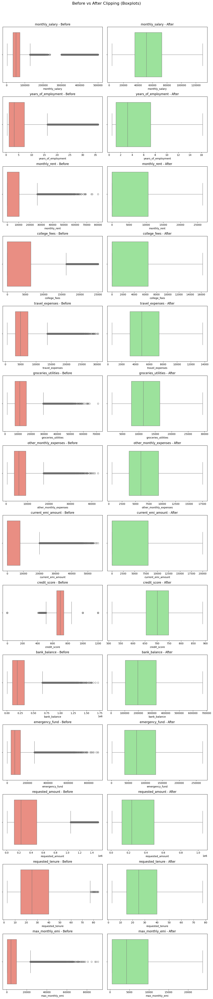

In [18]:
n = len(clipped_cols)
cols = 2  # before and after
rows = n

fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows))
fig.suptitle("Before vs After Clipping (Boxplots)", fontsize=16, y=0.995)

for i, col in enumerate(clipped_cols):
    sns.boxplot(x=data[col], ax=axes[i, 0], color='salmon')
    axes[i, 0].set_title(f"{col} - Before")
    sns.boxplot(x=df[col], ax=axes[i, 1], color='lightgreen')
    axes[i, 1].set_title(f"{col} - After")

plt.tight_layout()
plt.subplots_adjust(top=0.97)
plt.show()

## EDA

## 1. Age Distribution

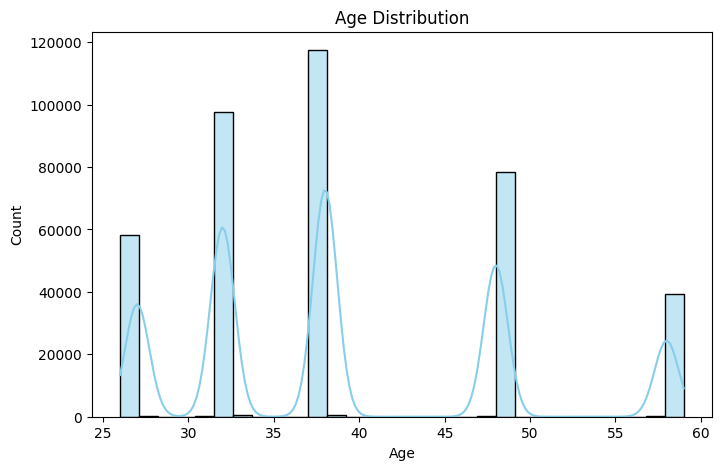

In [19]:
plt.figure(figsize=(8,5))
sns.histplot(df['age'], bins=30, kde=True, color='skyblue')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

## 2. Monthly Salary vs. Credit Score

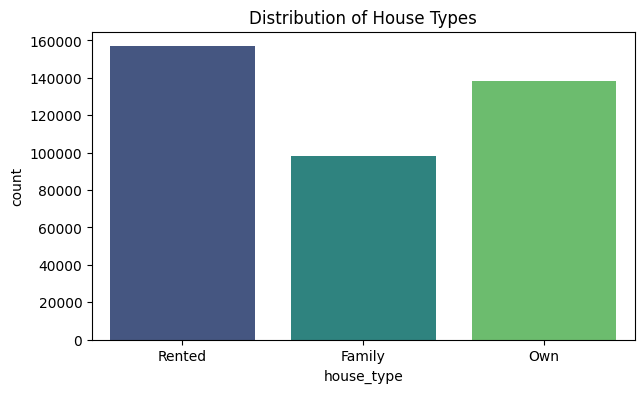

In [20]:
plt.figure(figsize=(7,4))
sns.countplot(data=df, x='house_type',hue='house_type', palette='viridis',legend=False)
plt.title('Distribution of House Types')
plt.xticks()
plt.show()

## 3. Family Size vs Monthly Expenses



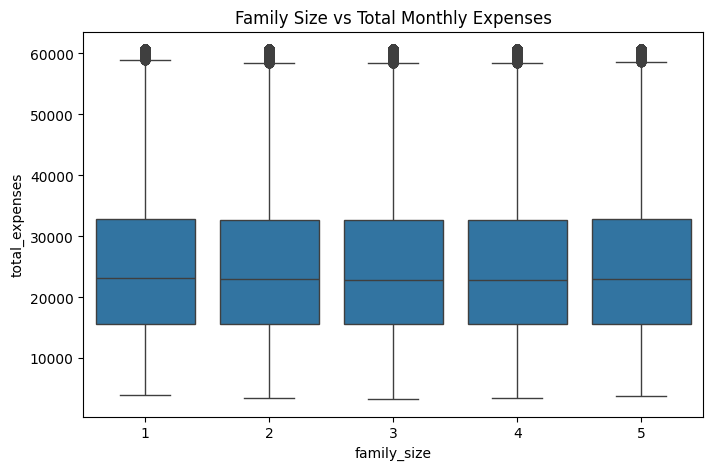

In [21]:
df['total_expenses'] = df['travel_expenses'] + df['groceries_utilities'] + df['other_monthly_expenses']
plt.figure(figsize=(8,5))
sns.boxplot(data=df, x='family_size', y='total_expenses')
plt.title('Family Size vs Total Monthly Expenses')
plt.show()

## 4. Employment Type vs Average Bank Balance

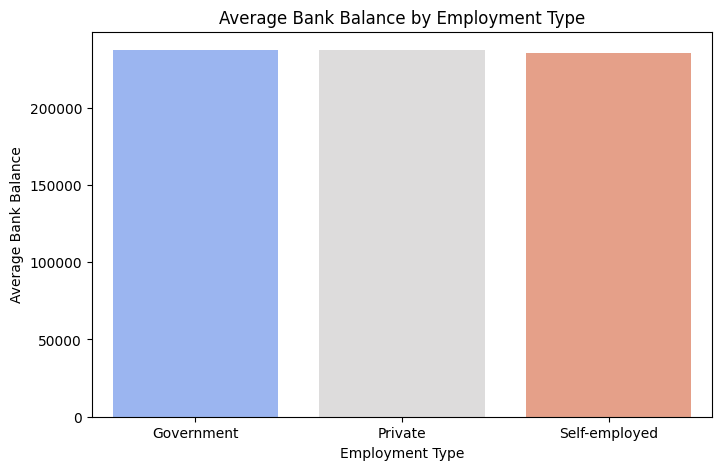

In [22]:
avg_balance = df.groupby('employment_type')['bank_balance'].mean().reset_index()
plt.figure(figsize=(8,5))
sns.barplot(data=avg_balance, x='employment_type',hue='employment_type', y='bank_balance',legend=False, palette='coolwarm')
plt.title('Average Bank Balance by Employment Type')
plt.xlabel("Employment Type")
plt.ylabel("Average Bank Balance")
plt.show()

## 5. Correlation Heatmap

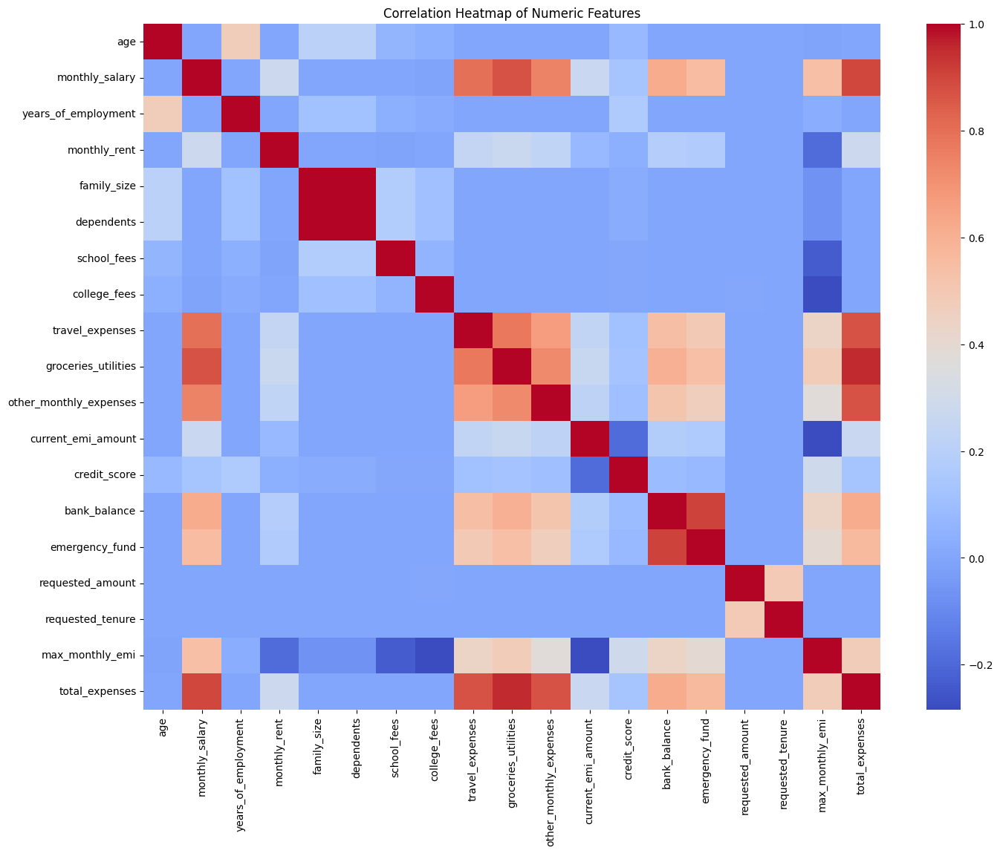

In [23]:
plt.figure(figsize=(16,12))
corr = df.select_dtypes('number').corr()
sns.heatmap(corr, cmap='coolwarm', annot=False)
plt.title('Correlation Heatmap of Numeric Features')
plt.show()


## 6. Credit Score Distribution by Marital Status

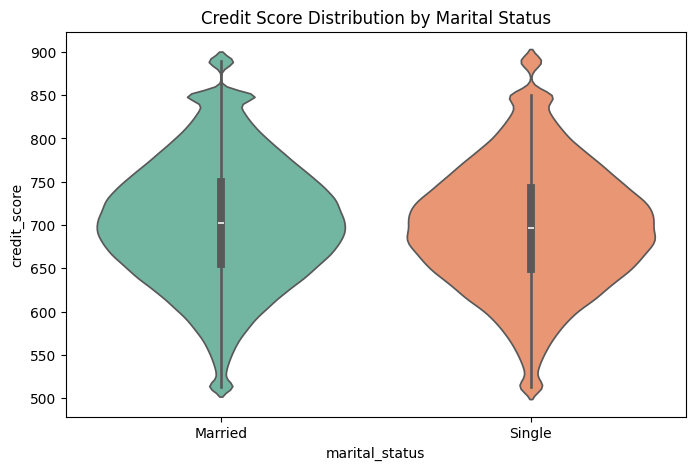

In [24]:
plt.figure(figsize=(8,5))
sns.violinplot(data=df, x='marital_status',hue='marital_status', y='credit_score', legend=False,palette='Set2')
plt.title('Credit Score Distribution by Marital Status')
plt.show()


## 7. EMI Scenario vs Max Monthly EMI

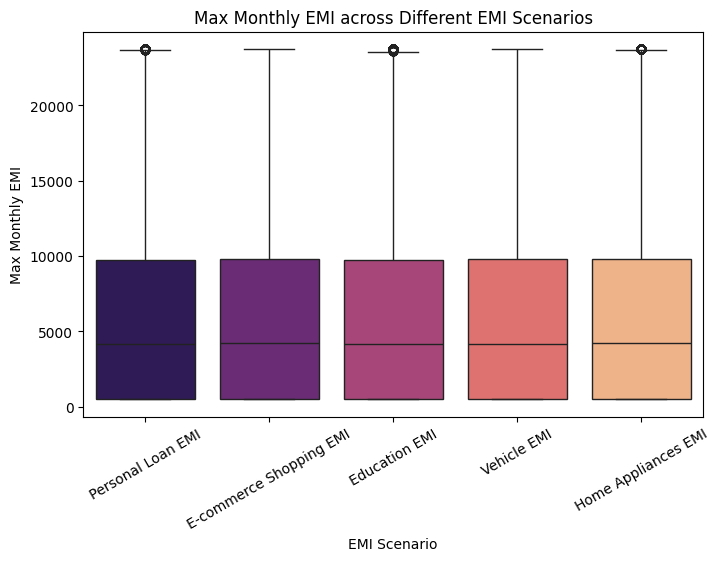

In [25]:
plt.figure(figsize=(8,5))
sns.boxplot(data=df, x='emi_scenario', hue='emi_scenario', y='max_monthly_emi', palette='magma', legend=False)
plt.xlabel('EMI Scenario')
plt.ylabel('Max Monthly EMI')
plt.xticks(rotation=30)
plt.title('Max Monthly EMI across Different EMI Scenarios')
plt.show()


## 8. Interactive Plot

In [26]:
px.scatter(df, x='monthly_salary', y='credit_score', color='education',
           size='requested_amount', hover_data=['employment_type'])


# Feature Engineering

In [27]:
for col in df.columns:
  print(f"Number of unique values for {col} are : {df[col].nunique()}")
  print(f"Data type of {col} is : {df[col].dtype}")
  print("-"*100)

Number of unique values for age are : 15
Data type of age is : int64
----------------------------------------------------------------------------------------------------
Number of unique values for gender are : 2
Data type of gender is : object
----------------------------------------------------------------------------------------------------
Number of unique values for marital_status are : 2
Data type of marital_status is : object
----------------------------------------------------------------------------------------------------
Number of unique values for education are : 4
Data type of education is : object
----------------------------------------------------------------------------------------------------
Number of unique values for monthly_salary are : 8312
Data type of monthly_salary is : int64
----------------------------------------------------------------------------------------------------
Number of unique values for employment_type are : 3
Data type of employment_type is : 

In [28]:
# Debt-to-Income Ratio
df['debt_to_income'] = df['current_emi_amount'] / df['monthly_salary'].replace(0, np.nan)
df['debt_to_income'] = df['debt_to_income'].replace([np.inf, -np.inf], np.nan)
df['debt_to_income'] = df['debt_to_income'].fillna(0)

# Expense-to-Income Ratio
df['expense_to_income'] = df['total_expenses'] / df['monthly_salary'].replace(0, np.nan)
df['expense_to_income'] = df['expense_to_income'].replace([np.inf, -np.inf], np.nan)
df['expense_to_income'] = df['expense_to_income'].fillna(0)

# Loan-Affordability Ratio
df['loan_affordability_ratio'] = df['requested_amount'] / df['monthly_salary'].replace(0, np.nan)
df['loan_affordability_ratio'] = df['loan_affordability_ratio'].replace([np.inf, -np.inf], np.nan)
df['loan_affordability_ratio'] = df['loan_affordability_ratio'].fillna(0)

In [29]:
# Defining bins based on common FICO score ranges, and handling values outside typical range.
bins = [0, 579, 669, 739, 799, np.inf]
labels = ['Very Poor', 'Fair', 'Good', 'Very Good', 'Excellent']
df['credit_score_category'] = pd.cut(df['credit_score'], bins=bins, labels=labels, right=True, include_lowest=True)

# Create binary 'employment_stability' indicator
df['employment_stability'] = (df['years_of_employment'] > 5).astype(int)

print("Risk scoring features generated.")

Risk scoring features generated.


In [30]:
# Income-Credit Interaction
df['income_credit_interaction'] = df['monthly_salary'] * df['credit_score']

# Loan-Balance Ratio
df['loan_balance_ratio'] = df['requested_amount'] / df['bank_balance'].replace(0, np.nan)
df['loan_balance_ratio'] = df['loan_balance_ratio'].replace([np.inf, -np.inf], np.nan)
df['loan_balance_ratio'] = df['loan_balance_ratio'].fillna(0)
print("Interaction features developed.")

Interaction features developed.


In [31]:
# Identify all numerical features (excluding the newly encoded target variable)
numerical_features = df.select_dtypes(include=np.number).columns.tolist()
if 'emi_eligibility_encoded' in numerical_features:
    numerical_features.remove('emi_eligibility_encoded')

print(f"Numerical features to scale: {numerical_features[:5]}...") # Print first 5 for brevity

# Apply StandardScaler to normalize their ranges
scaler = StandardScaler()
df[numerical_features] = scaler.fit_transform(df[numerical_features])

print("\nNumerical features scaled.")

Numerical features to scale: ['age', 'monthly_salary', 'years_of_employment', 'monthly_rent', 'family_size']...

Numerical features scaled.


In [32]:
# Encode the target variable 'emi_eligibility' using LabelEncoder
label_encoder = LabelEncoder()
df['emi_eligibility_encoded'] = label_encoder.fit_transform(df['emi_eligibility'])
print(f"Original 'emi_eligibility' categories: {label_encoder.classes_}")
print(f"Encoded 'emi_eligibility' categories (0, 1, 2...): {np.sort(df['emi_eligibility_encoded'].unique())}")

# Identify all remaining categorical columns (object or categorical dtype)
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

# Remove the original 'emi_eligibility' from the list of columns to one-hot encode
if 'emi_eligibility' in categorical_cols:
    categorical_cols.remove('emi_eligibility')

print(f"\nCategorical columns to one-hot encode: {categorical_cols}")

# Apply one-hot encoding using pd.get_dummies
df = pd.get_dummies(df, columns=categorical_cols, drop_first=True)

# Convert any boolean columns to integers (for consistency)
df = df.astype({col: int for col in df.select_dtypes(bool).columns})

# Drop the original 'emi_eligibility' column
df.drop('emi_eligibility', axis=1, inplace=True)

print("Categorical encoding applied.")

Original 'emi_eligibility' categories: ['Eligible' 'High_Risk' 'Not_Eligible']
Encoded 'emi_eligibility' categories (0, 1, 2...): [0 1 2]

Categorical columns to one-hot encode: ['gender', 'marital_status', 'education', 'employment_type', 'company_type', 'house_type', 'existing_loans', 'emi_scenario', 'credit_score_category']
Categorical encoding applied.


In [33]:
print(f"Preview of the dataset after feature engineering : ")
print(display(df.head()))
print(f"Columns of the dataset :\n{df.columns}")

Preview of the dataset after feature engineering : 


,age,monthly_salary,years_of_employment,monthly_rent,family_size,dependents,school_fees,college_fees,travel_expenses,groceries_utilities,...,house_type_Rented,existing_loans_Yes,emi_scenario_Education EMI,emi_scenario_Home Appliances EMI,emi_scenario_Personal Loan EMI,emi_scenario_Vehicle EMI,credit_score_category_Fair,credit_score_category_Good,credit_score_category_Very Good,credit_score_category_Excellent
0,-0.094366,0.912541,-0.851567,1.805035,0.055150,0.055150,-0.913915,-0.57857,0.510319,1.049611,...,1,1,0,0,1,0,1,0,0,0
1,-0.094366,-1.244438,0.434342,-0.705132,-0.875071,-0.875071,0.093765,-0.57857,-1.344848,-1.113081,...,0,1,0,0,0,0,0,1,0,0
2,-0.094366,1.036099,0.181376,-0.705132,0.985370,0.985370,-0.913915,-0.57857,1.469888,1.034273,...,0,0,1,0,0,0,1,0,0,0
3,2.056057,0.354762,-0.577521,-0.705132,1.915591,1.915591,1.338546,-0.57857,0.190462,-0.116095,...,0,0,0,0,0,1,0,1,0,0
4,0.980845,0.019389,-0.324555,-0.705132,0.985370,0.985370,0.943377,2.07367,-0.641164,0.543449,...,0,0,0,1,0,0,0,0,1,0


None
Columns of the dataset :
Index(['age', 'monthly_salary', 'years_of_employment', 'monthly_rent',
       'family_size', 'dependents', 'school_fees', 'college_fees',
       'travel_expenses', 'groceries_utilities', 'other_monthly_expenses',
       'current_emi_amount', 'credit_score', 'bank_balance', 'emergency_fund',
       'requested_amount', 'requested_tenure', 'max_monthly_emi',
       'total_expenses', 'debt_to_income', 'expense_to_income',
       'loan_affordability_ratio', 'employment_stability',
       'income_credit_interaction', 'loan_balance_ratio',
       'emi_eligibility_encoded', 'gender_male', 'marital_status_Single',
       'education_High School', 'education_Post Graduate',
       'education_Professional', 'employment_type_Private',
       'employment_type_Self-employed', 'company_type_MNC',
       'company_type_Mid-size', 'company_type_Small', 'company_type_Startup',
       'house_type_Own', 'house_type_Rented', 'existing_loans_Yes',
       'emi_scenario_Education E

In [34]:
df.isnull().sum()

,0
age,0
monthly_salary,0
years_of_employment,0
monthly_rent,0
family_size,0
dependents,0
school_fees,0
college_fees,0
travel_expenses,0
groceries_utilities,0


## Handling remaining NaN values

# ML Model Development

In [48]:
# Ensure no NaNs are left in df before creating X and y
if df.isnull().sum().sum() != 0:
    print("Warning: DataFrame still contains NaN values. Please address them before proceeding.")
    print(df.isnull().sum()[df.isnull().sum() > 0])
    mean_balance=df['bank_balance'].mean()
    df['bank_balance'].fillna(mean_balance, inplace=True)
    print("NaN values successfully handled")

else:
    print("DataFrame is free of NaN values.")

target_clf = 'emi_eligibility_encoded'
target_reg = 'max_monthly_emi'

# Drop target columns from features (and any non-feature cols like IDs)
non_feature_cols = [target_clf, target_reg]
X = df.drop(columns=[c for c in non_feature_cols if c in df.columns]).copy()
y_clf = df[target_clf].copy()
y_reg = df[target_reg].copy()


DataFrame is free of NaN values.


In [49]:
print(f"Features shape: {X.shape}, Classification classes: {np.unique(y_clf)}, Regression target range: {y_reg.min()} - {y_reg.max()}")

Features shape: (392920, 46), Classification classes: [0 1 2], Regression target range: -0.8936266558759424 - 2.6002317906382326


In [50]:
# 2. Train / test split
from sklearn.model_selection import train_test_split

X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(
    X, y_clf, test_size=0.2, random_state=42, stratify=y_clf
)

X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(
    X, y_reg, test_size=0.2, random_state=42
)

print("Train/test split successfully re-created.")

Train/test split successfully re-created.


In [51]:
# 3. Classification models to train
clf_models = {
    "LogisticRegression": LogisticRegression(max_iter=500, class_weight='balanced', random_state=42),
    "RandomForest": RandomForestClassifier(n_estimators=200, random_state=42, class_weight='balanced'),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
}

In [52]:
# 4. Regression models to train
reg_models = {
    "LinearRegression": LinearRegression(),
    "RandomForestRegressor": RandomForestRegressor(n_estimators=200, random_state=42),
    "XGBoostRegressor": XGBRegressor(random_state=42, objective='reg:squarederror')
}

In [53]:
def evaluate_classification(model, X_test, y_test, average='weighted'):
    y_pred = model.predict(X_test)
    # For multiclass ROC-AUC compute one-vs-rest
    try:
        if hasattr(model, "predict_proba"):
            proba = model.predict_proba(X_test)
            lb = LabelBinarizer()
            y_test_b = lb.fit_transform(y_test)
            # If binary, LabelBinarizer returns shape (n,1) => adapt:
            if y_test_b.shape[1] == 1:
                y_test_b = np.hstack([1-y_test_b, y_test_b])
            roc_auc = roc_auc_score(y_test_b, proba, average='weighted', multi_class='ovr')
        else:
            roc_auc = np.nan
    except Exception as e:
        roc_auc = np.nan

    metrics = {
        "accuracy": accuracy_score(y_test, y_pred),
        "precision": precision_score(y_test, y_pred, average=average, zero_division=0),
        "recall": recall_score(y_test, y_pred, average=average, zero_division=0),
        "f1": f1_score(y_test, y_pred, average=average, zero_division=0),
        "roc_auc": roc_auc,
        "confusion_matrix": confusion_matrix(y_test, y_pred),
        "classification_report": classification_report(y_test, y_pred, zero_division=0)
    }
    return metrics

In [54]:
def evaluate_regression(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    # MAPE: handle zeros in y_test
    mape = np.mean(np.abs((y_test - y_pred) / np.where(y_test == 0, 1e-8, y_test))) * 100
    metrics = {
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2,
        "MAPE(%)": mape
    }
    return metrics

In [55]:
# 6. Train classification models and evaluate
clf_results = {}
for name, model in clf_models.items():
    print(f"\nTraining classifier: {name}")
    model.fit(X_train_c, y_train_c)
    metrics = evaluate_classification(model, X_test_c, y_test_c)
    clf_results[name] = {"model": model, "metrics": metrics}
    print(f"{name} metrics: acc={metrics['accuracy']:.4f}, f1={metrics['f1']:.4f}, roc_auc={metrics['roc_auc']:.4f}")

# 7. Show feature importances for tree models (RandomForest and XGBoost) if available
def show_feature_importances(model, feature_names, top_n=20):
    if hasattr(model, "feature_importances_"):
        importances = model.feature_importances_
        fi = pd.Series(importances, index=feature_names).sort_values(ascending=False)
        print(fi.head(top_n))
        return fi
    else:
        print("No feature_importances_ attribute for this model.")
        return None

# Example: RandomForest and XGBoost feature importance
for name in ["RandomForest", "XGBoost"]:
    if name in clf_results:
        print(f"\n{name} feature importances (top 15):")
        show_feature_importances(clf_results[name]['model'], X.columns, top_n=15)

# 8. Pick best classifier by F1 (or ROC-AUC if you prefer)
best_clf_name = max(clf_results.keys(), key=lambda n: clf_results[n]['metrics']['f1'])
best_clf = clf_results[best_clf_name]['model']
print(f"\nBest classifier by F1: {best_clf_name} (F1={clf_results[best_clf_name]['metrics']['f1']:.4f})")

# Save best classifier
joblib.dump(best_clf, f"best_classifier_{best_clf_name}.joblib")
print(f"Saved best classifier to best_classifier_{best_clf_name}.joblib")

# 9. Train regression models and evaluate
reg_results = {}
for name, model in reg_models.items():
    print(f"\nTraining regressor: {name}")
    model.fit(X_train_r, y_train_r)
    metrics = evaluate_regression(model, X_test_r, y_test_r)
    reg_results[name] = {"model": model, "metrics": metrics}
    print(f"{name} metrics: RMSE={metrics['RMSE']:.2f}, MAE={metrics['MAE']:.2f}, R2={metrics['R2']:.4f}, MAPE={metrics['MAPE(%)']:.2f}%")

# Feature importances for top regressors
for name in ["RandomForestRegressor", "XGBoostRegressor"]:
    if name in reg_results:
        print(f"\n{name} feature importances (top 15):")
        show_feature_importances(reg_results[name]['model'], X.columns, top_n=15)

# 10. Pick best regressor by RMSE (lowest)
best_reg_name = min(reg_results.keys(), key=lambda n: reg_results[n]['metrics']['RMSE'])
best_reg = reg_results[best_reg_name]['model']
print(f"\nBest regressor by RMSE: {best_reg_name} (RMSE={reg_results[best_reg_name]['metrics']['RMSE']:.2f})")

# Save best regressor
joblib.dump(best_reg, f"best_regressor_{best_reg_name}.joblib")
print(f"Saved best regressor to best_regressor_{best_reg_name}.joblib")

# 11. (Optional) Quick hyperparameter tuning example for RandomForestClassifier
# NOTE: RandomizedSearchCV can be time-consuming; adjust n_iter and cv accordingly.
param_dist = {
    "n_estimators": [100, 200, 400],
    "max_depth": [None, 8, 16, 32],
    "min_samples_split": [2, 5, 10]
}
rfc = RandomForestClassifier(random_state=42, class_weight='balanced')
rsearch = RandomizedSearchCV(rfc, param_distributions=param_dist, n_iter=6, cv=3, scoring='f1_weighted', random_state=42, n_jobs=-1)
print("\nRunning quick RandomizedSearchCV for RandomForestClassifier (this may take a while)...")
rsearch.fit(X_train_c, y_train_c)
print("Best params (RandomForest quick search):", rsearch.best_params_)
best_rfc_tuned = rsearch.best_estimator_
joblib.dump(best_rfc_tuned, "rfc_tuned.joblib")
print("Saved tuned RandomForestClassifier to rfc_tuned.joblib")

# 12. Summary outputs
print("\nClassification results summary (F1 & ROC-AUC):")
for name, res in clf_results.items():
    print(f"{name:20s} F1={res['metrics']['f1']:.4f} ROC-AUC={res['metrics']['roc_auc']:.4f}")

print("\nRegression results summary (RMSE & R2):")
for name, res in reg_results.items():
    print(f"{name:25s} RMSE={res['metrics']['RMSE']:.2f} R2={res['metrics']['R2']:.4f}")


Training classifier: LogisticRegression
LogisticRegression metrics: acc=0.8307, f1=0.8702, roc_auc=0.9715

Training classifier: RandomForest
RandomForest metrics: acc=0.9274, f1=0.9074, roc_auc=0.9865

Training classifier: XGBoost


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning:

[17:30:46] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.




XGBoost metrics: acc=0.9576, f1=0.9483, roc_auc=0.9963

RandomForest feature importances (top 15):
loan_affordability_ratio     0.120127
requested_tenure             0.097066
loan_balance_ratio           0.081538
requested_amount             0.074940
income_credit_interaction    0.048429
monthly_salary               0.041276
expense_to_income            0.040307
school_fees                  0.037323
college_fees                 0.035085
total_expenses               0.030876
credit_score                 0.029336
bank_balance                 0.028801
groceries_utilities          0.028267
debt_to_income               0.027176
emergency_fund               0.026229
dtype: float64

XGBoost feature importances (top 15):
current_emi_amount               0.147899
house_type_Rented                0.128335
loan_affordability_ratio         0.120037
college_fees                     0.097546
requested_tenure                 0.060139
school_fees                      0.055539
income_credit_interaction